In [93]:
from rdkit import Chem
from rdkit.Chem import Descriptors
import pandas as pd
import numpy as np
import random
import os
os.environ['R_HOME'] = 'C:\Programming\R\R-4.4.2'

In [94]:
# 재현성 난수 고정
SEED = 100

os.environ['PYTHONHASHSEED'] = str(SEED)
os.environ['TF_DETERMINISTIC_OPS'] = '1'

random.seed(SEED)
np.random.seed(SEED)

In [95]:
# data load
df_name = 'qm9_hc_reduced'
df = pd.read_csv('C:\Programming\Github\EGCN\data\\' + df_name + '.csv')

smiles_list = df['smiles'].tolist()

# target 정의
target = df.iloc[:,-1]

print(smiles_list[:5])
print(target[:5])

['CC1C=CC(C)(O)C1C', 'OC1CC2CC2C(O)C1', 'COC1C(=O)C=CC1=O', 'COc1ccc(nc1)N', 'c1c(cn[nH]1)C2COC2']
0    38.860
1    34.305
2    29.513
3    31.100
4    27.773
Name: heat_capacity, dtype: float64


In [96]:
# 분자 특성 추출 class
class MolecularFeatureExtractor:
    def __init__(self):
        self.descriptors = [desc[0] for desc in Descriptors._descList]

    def extract_molecular_features(self, smiles_list):
        features_dict = {desc: [] for desc in self.descriptors}

        for smiles in smiles_list:
            mol = Chem.MolFromSmiles(smiles)
            if mol:
                for descriptor_name in self.descriptors:
                    descriptor_function = getattr(Descriptors, descriptor_name)
                    try:
                        features_dict[descriptor_name].append(descriptor_function(mol))
                    except:
                        features_dict[descriptor_name].append(None)
            else:
                for descriptor_name in self.descriptors:
                    features_dict[descriptor_name].append(None)

        return pd.DataFrame(features_dict)

In [97]:
# 분자 특성 추출 및 데이터프레임 정의
extractor = MolecularFeatureExtractor()
df_all_features = extractor.extract_molecular_features(smiles_list)

df_all_features['target'] = target
df_all_features.head()

,MaxEStateIndex,MinEStateIndex,MaxAbsEStateIndex,MinAbsEStateIndex,qed,MolWt,HeavyAtomMolWt,ExactMolWt,NumValenceElectrons,NumRadicalElectrons,...,fr_sulfonamd,fr_sulfone,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiocyan,fr_thiophene,fr_unbrch_alkane,fr_urea,target
0,9.546574,-0.556134,9.546574,0.372685,0.488461,126.199,112.087,126.104465,52,0,...,0,0,0,0,0,0,0,0,0,38.860
1,9.229769,-0.218750,9.229769,0.195602,0.486832,128.171,116.075,128.083730,52,0,...,0,0,0,0,0,0,0,0,0,34.305
2,10.583102,-0.856481,10.583102,0.261574,0.453248,126.111,120.063,126.031694,48,0,...,0,0,0,0,0,0,0,0,0,29.513
3,5.314705,0.510000,5.314705,0.510000,0.598238,124.143,116.079,124.063663,48,0,...,0,0,0,0,0,0,0,0,0,31.100
4,5.016991,0.600694,5.016991,0.600694,0.592402,124.143,116.079,124.063663,48,0,...,0,0,0,0,0,0,0,0,0,27.773


In [98]:
num_all_features = df_all_features.shape[1] - 1  # logvp 열 제외
print("초기 변수 개수:", num_all_features)

초기 변수 개수: 208


# 1. NA Handling

In [99]:
# NA 확인
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
df_all_features[df_all_features.isna().any(axis = 1)]

,MaxEStateIndex,MinEStateIndex,MaxAbsEStateIndex,MinAbsEStateIndex,qed,MolWt,HeavyAtomMolWt,ExactMolWt,NumValenceElectrons,NumRadicalElectrons,MaxPartialCharge,MinPartialCharge,MaxAbsPartialCharge,MinAbsPartialCharge,FpDensityMorgan1,FpDensityMorgan2,FpDensityMorgan3,BCUT2D_MWHI,BCUT2D_MWLOW,BCUT2D_CHGHI,BCUT2D_CHGLO,BCUT2D_LOGPHI,BCUT2D_LOGPLOW,BCUT2D_MRHI,BCUT2D_MRLOW,BalabanJ,BertzCT,Chi0,Chi0n,Chi0v,Chi1,Chi1n,Chi1v,Chi2n,Chi2v,Chi3n,Chi3v,Chi4n,Chi4v,HallKierAlpha,Ipc,Kappa1,Kappa2,Kappa3,LabuteASA,PEOE_VSA1,PEOE_VSA10,PEOE_VSA11,PEOE_VSA12,PEOE_VSA13,PEOE_VSA14,PEOE_VSA2,PEOE_VSA3,PEOE_VSA4,PEOE_VSA5,PEOE_VSA6,PEOE_VSA7,PEOE_VSA8,PEOE_VSA9,SMR_VSA1,SMR_VSA10,SMR_VSA2,SMR_VSA3,SMR_VSA4,SMR_VSA5,SMR_VSA6,SMR_VSA7,SMR_VSA8,SMR_VSA9,SlogP_VSA1,SlogP_VSA10,SlogP_VSA11,SlogP_VSA12,SlogP_VSA2,SlogP_VSA3,SlogP_VSA4,SlogP_VSA5,SlogP_VSA6,SlogP_VSA7,SlogP_VSA8,SlogP_VSA9,TPSA,EState_VSA1,EState_VSA10,EState_VSA11,EState_VSA2,EState_VSA3,EState_VSA4,EState_VSA5,EState_VSA6,EState_VSA7,EState_VSA8,EState_VSA9,VSA_EState1,VSA_EState10,VSA_EState2,VSA_EState3,VSA_EState4,VSA_EState5,VSA_EState6,VSA_EState7,VSA_EState8,VSA_EState9,FractionCSP3,HeavyAtomCount,NHOHCount,NOCount,NumAliphaticCarbocycles,NumAliphaticHeterocycles,NumAliphaticRings,NumAromaticCarbocycles,NumAromaticHeterocycles,NumAromaticRings,NumHAcceptors,NumHDonors,NumHeteroatoms,NumRotatableBonds,NumSaturatedCarbocycles,NumSaturatedHeterocycles,NumSaturatedRings,RingCount,MolLogP,MolMR,fr_Al_COO,fr_Al_OH,fr_Al_OH_noTert,fr_ArN,fr_Ar_COO,fr_Ar_N,fr_Ar_NH,fr_Ar_OH,fr_COO,fr_COO2,fr_C_O,fr_C_O_noCOO,fr_C_S,fr_HOCCN,fr_Imine,fr_NH0,fr_NH1,fr_NH2,fr_N_O,fr_Ndealkylation1,fr_Ndealkylation2,fr_Nhpyrrole,fr_SH,fr_aldehyde,fr_alkyl_carbamate,fr_alkyl_halide,fr_allylic_oxid,fr_amide,fr_amidine,fr_aniline,fr_aryl_methyl,fr_azide,fr_azo,fr_barbitur,fr_benzene,fr_benzodiazepine,fr_bicyclic,fr_diazo,fr_dihydropyridine,fr_epoxide,fr_ester,fr_ether,fr_furan,fr_guanido,fr_halogen,fr_hdrzine,fr_hdrzone,fr_imidazole,fr_imide,fr_isocyan,fr_isothiocyan,fr_ketone,fr_ketone_Topliss,fr_lactam,fr_lactone,fr_methoxy,fr_morpholine,fr_nitrile,fr_nitro,fr_nitro_arom,fr_nitro_arom_nonortho,fr_nitroso,fr_oxazole,fr_oxime,fr_para_hydroxylation,fr_phenol,fr_phenol_noOrthoHbond,fr_phos_acid,fr_phos_ester,fr_piperdine,fr_piperzine,fr_priamide,fr_prisulfonamd,fr_pyridine,fr_quatN,fr_sulfide,fr_sulfonamd,fr_sulfone,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiocyan,fr_thiophene,fr_unbrch_alkane,fr_urea,target


In [100]:
# 결측치가 포함된 feature 개수
print('결측치가 포함된 열 개수:', df_all_features.isna().any(axis = 0).sum(), '\n')
print(df_all_features.isna().any(axis = 0))

결측치가 포함된 열 개수: 0 

MaxEStateIndex              False
MinEStateIndex              False
MaxAbsEStateIndex           False
MinAbsEStateIndex           False
qed                         False
MolWt                       False
HeavyAtomMolWt              False
ExactMolWt                  False
NumValenceElectrons         False
NumRadicalElectrons         False
MaxPartialCharge            False
MinPartialCharge            False
MaxAbsPartialCharge         False
MinAbsPartialCharge         False
FpDensityMorgan1            False
FpDensityMorgan2            False
FpDensityMorgan3            False
BCUT2D_MWHI                 False
BCUT2D_MWLOW                False
BCUT2D_CHGHI                False
BCUT2D_CHGLO                False
BCUT2D_LOGPHI               False
BCUT2D_LOGPLOW              False
BCUT2D_MRHI                 False
BCUT2D_MRLOW                False
BalabanJ                    False
BertzCT                     False
Chi0                        False
Chi0n                       F

In [101]:
pd.reset_option('display.max_rows')
pd.reset_option('display.max_columns')

In [102]:
# 결측치가 포함된 feature 제거
df_removed_features = df_all_features.dropna(axis = 1)
num_removed_features = df_removed_features.shape[1] - 1  # logvp 열 제외

print("제거 후 남은 feature 개수:", num_removed_features)

제거 후 남은 feature 개수: 208


In [103]:
# 결측치가 제거된 data frame
df_removed_features

,MaxEStateIndex,MinEStateIndex,MaxAbsEStateIndex,MinAbsEStateIndex,qed,MolWt,HeavyAtomMolWt,ExactMolWt,NumValenceElectrons,NumRadicalElectrons,...,fr_sulfonamd,fr_sulfone,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiocyan,fr_thiophene,fr_unbrch_alkane,fr_urea,target
0,9.546574,-0.556134,9.546574,0.372685,0.488461,126.199,112.087,126.104465,52,0,...,0,0,0,0,0,0,0,0,0,38.860
1,9.229769,-0.218750,9.229769,0.195602,0.486832,128.171,116.075,128.083730,52,0,...,0,0,0,0,0,0,0,0,0,34.305
2,10.583102,-0.856481,10.583102,0.261574,0.453248,126.111,120.063,126.031694,48,0,...,0,0,0,0,0,0,0,0,0,29.513
3,5.314705,0.510000,5.314705,0.510000,0.598238,124.143,116.079,124.063663,48,0,...,0,0,0,0,0,0,0,0,0,31.100
4,5.016991,0.600694,5.016991,0.600694,0.592402,124.143,116.079,124.063663,48,0,...,0,0,0,0,0,0,0,0,0,27.773
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,10.516944,-0.077473,10.516944,0.042269,0.571240,132.159,120.063,132.078644,54,0,...,0,0,0,0,0,0,0,0,0,38.163
1996,10.513013,0.044861,10.513013,0.044861,0.404750,124.183,112.087,124.088815,50,0,...,0,0,0,0,0,0,0,0,0,38.308
1997,8.265820,0.432870,8.265820,0.432870,0.511219,124.143,116.079,124.063663,48,0,...,0,0,0,0,0,0,0,0,0,30.722
1998,10.087917,-0.851852,10.087917,0.016296,0.379344,132.071,128.039,132.005873,50,0,...,0,0,0,0,0,0,0,0,0,26.195


# 2. nunique == 1 인 경우

In [104]:
unique_columns = list(df_removed_features.loc[:, df_removed_features.nunique() == 1].columns)
print('nunique == 1인 feature : \n', unique_columns, '\n')

# nunique == 1인 feature 제거
#df_removed_features.drop(columns = unique_columns, inplace = True)
df_removed_features = df_removed_features.drop(columns = unique_columns).copy()

num_removed_features = df_removed_features.shape[1] - 1  # logvp 열 제외

print("제거 후 남은 feature 개수:", num_removed_features, '\n')
print(df_removed_features.shape)


nunique == 1인 feature : 
 ['NumRadicalElectrons', 'SMR_VSA8', 'SlogP_VSA12', 'SlogP_VSA7', 'SlogP_VSA9', 'EState_VSA11', 'VSA_EState10', 'fr_C_S', 'fr_N_O', 'fr_SH', 'fr_azide', 'fr_azo', 'fr_barbitur', 'fr_benzodiazepine', 'fr_diazo', 'fr_dihydropyridine', 'fr_hdrzine', 'fr_hdrzone', 'fr_isocyan', 'fr_isothiocyan', 'fr_nitro_arom', 'fr_nitro_arom_nonortho', 'fr_nitroso', 'fr_para_hydroxylation', 'fr_phos_acid', 'fr_phos_ester', 'fr_prisulfonamd', 'fr_sulfide', 'fr_sulfonamd', 'fr_sulfone', 'fr_thiazole', 'fr_thiocyan', 'fr_thiophene'] 

제거 후 남은 feature 개수: 175 

(2000, 176)


In [105]:
df_removed_features

,MaxEStateIndex,MinEStateIndex,MaxAbsEStateIndex,MinAbsEStateIndex,qed,MolWt,HeavyAtomMolWt,ExactMolWt,NumValenceElectrons,MaxPartialCharge,...,fr_piperdine,fr_piperzine,fr_priamide,fr_pyridine,fr_quatN,fr_term_acetylene,fr_tetrazole,fr_unbrch_alkane,fr_urea,target
0,9.546574,-0.556134,9.546574,0.372685,0.488461,126.199,112.087,126.104465,52,0.083016,...,0,0,0,0,0,0,0,0,0,38.860
1,9.229769,-0.218750,9.229769,0.195602,0.486832,128.171,116.075,128.083730,52,0.059531,...,0,0,0,0,0,0,0,0,0,34.305
2,10.583102,-0.856481,10.583102,0.261574,0.453248,126.111,120.063,126.031694,48,0.191979,...,0,0,0,0,0,0,0,0,0,29.513
3,5.314705,0.510000,5.314705,0.510000,0.598238,124.143,116.079,124.063663,48,0.136812,...,0,0,0,1,0,0,0,0,0,31.100
4,5.016991,0.600694,5.016991,0.600694,0.592402,124.143,116.079,124.063663,48,0.055791,...,0,0,0,0,0,0,0,0,0,27.773
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,10.516944,-0.077473,10.516944,0.042269,0.571240,132.159,120.063,132.078644,54,0.160250,...,0,0,0,0,0,0,0,0,0,38.163
1996,10.513013,0.044861,10.513013,0.044861,0.404750,124.183,112.087,124.088815,50,0.204668,...,0,0,0,0,0,0,0,0,0,38.308
1997,8.265820,0.432870,8.265820,0.432870,0.511219,124.143,116.079,124.063663,48,0.097762,...,0,0,0,0,0,0,0,0,0,30.722
1998,10.087917,-0.851852,10.087917,0.016296,0.379344,132.071,128.039,132.005873,50,0.511290,...,0,0,0,0,0,0,0,0,0,26.195


# 3. 너무 낮은 variance를 가지는 경우

In [106]:
low_variances = sorted(df_removed_features.var())
low_variances[:10]

[0.0005000000000000001,
 0.0005000000000000001,
 0.0005000000000000001,
 0.0005000000000000001,
 0.0005000000000000001,
 0.0009994997498749378,
 0.0014984992496248123,
 0.0029924962481240624,
 0.004481990995497752,
 0.004481990995497752]

In [107]:
columns_low_variances = []

for i in low_variances:
    if i < 0.001:
        column = df_removed_features.loc[:, df_removed_features.var() == i].columns
        columns_low_variances.append(column)
columns_low_variances = [item for index in columns_low_variances for item in index]

# 2. 중복 제거 및 유니크 값 추출
columns_low_variances = list(set(columns_low_variances))
print(columns_low_variances)

['fr_Ar_COO', 'fr_benzene', 'fr_phenol_noOrthoHbond', 'NumAromaticCarbocycles', 'fr_phenol', 'fr_nitro']


In [108]:
# 낮은 분산의 변수 제거
df_removed_features = df_removed_features.drop(columns = columns_low_variances).copy()
num_removed_features = df_removed_features.shape[1] - 1  # logvp 열 제외

print("제거 후 남은 feature 개수:", num_removed_features, '\n')
print(df_removed_features.shape)

제거 후 남은 feature 개수: 169 

(2000, 170)


In [109]:
print("제거 후 남은 feature 개수:", num_removed_features, '\n')
print(df_removed_features.shape)

제거 후 남은 feature 개수: 169 

(2000, 170)


In [110]:
df_removed_features

,MaxEStateIndex,MinEStateIndex,MaxAbsEStateIndex,MinAbsEStateIndex,qed,MolWt,HeavyAtomMolWt,ExactMolWt,NumValenceElectrons,MaxPartialCharge,...,fr_piperdine,fr_piperzine,fr_priamide,fr_pyridine,fr_quatN,fr_term_acetylene,fr_tetrazole,fr_unbrch_alkane,fr_urea,target
0,9.546574,-0.556134,9.546574,0.372685,0.488461,126.199,112.087,126.104465,52,0.083016,...,0,0,0,0,0,0,0,0,0,38.860
1,9.229769,-0.218750,9.229769,0.195602,0.486832,128.171,116.075,128.083730,52,0.059531,...,0,0,0,0,0,0,0,0,0,34.305
2,10.583102,-0.856481,10.583102,0.261574,0.453248,126.111,120.063,126.031694,48,0.191979,...,0,0,0,0,0,0,0,0,0,29.513
3,5.314705,0.510000,5.314705,0.510000,0.598238,124.143,116.079,124.063663,48,0.136812,...,0,0,0,1,0,0,0,0,0,31.100
4,5.016991,0.600694,5.016991,0.600694,0.592402,124.143,116.079,124.063663,48,0.055791,...,0,0,0,0,0,0,0,0,0,27.773
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,10.516944,-0.077473,10.516944,0.042269,0.571240,132.159,120.063,132.078644,54,0.160250,...,0,0,0,0,0,0,0,0,0,38.163
1996,10.513013,0.044861,10.513013,0.044861,0.404750,124.183,112.087,124.088815,50,0.204668,...,0,0,0,0,0,0,0,0,0,38.308
1997,8.265820,0.432870,8.265820,0.432870,0.511219,124.143,116.079,124.063663,48,0.097762,...,0,0,0,0,0,0,0,0,0,30.722
1998,10.087917,-0.851852,10.087917,0.016296,0.379344,132.071,128.039,132.005873,50,0.511290,...,0,0,0,0,0,0,0,0,0,26.195


# 4. 데이터 스크리닝 (ISIS)

In [111]:
X_train = df_removed_features.drop(columns = 'target')
y_train = df_removed_features['target']

print(X_train.shape)
print(y_train.shape)

(2000, 169)
(2000,)


In [112]:
# 스케일링
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaler.fit(X_train)

X_train_scaling = scaler.transform(X_train)
print(X_train_scaling.shape)

(2000, 169)


In [113]:
# Python to R type
from rpy2.robjects import r
from rpy2.robjects import pandas2ri
from rpy2.robjects import FloatVector

pandas2ri.activate()

X_train_scaling = r['as.matrix'](X_train_scaling)

y_train = FloatVector(y_train)

nfolds = 10
nfolds = FloatVector([nfolds])[0]

nsis = 100
nsis = FloatVector([nsis])[0]

seed = 9
seed = FloatVector([seed])[0]

In [114]:
from rpy2.robjects.packages import importr
import sys
import io

SIS = importr('SIS')

# R 출력이 발생할 때 UTF-8 오류를 방지하기 위해, 표준 출력을 임시로 바꿔서 처리할 수 있습니다.
#r('Sys.setlocale("LC_ALL", "C.UTF-8")')

# model1 = SIS(...)
model1 = SIS.SIS(X_train_scaling,y_train,
    family="gaussian",
#    penalty="MCP",
    tune="cv",
    nfolds=nfolds,
    nsis=nsis,
    varISIS="aggr",
    seed=seed,
    q = 0.95,
    standardize=False)


Iter 1 , screening:  5 6 7 8 9 10 13 15 16 26 27 28 29 30 31 32 33 34 39 41 42 43 44 46 47 50 51 52 55 56 60 62 64 66 74 75 85 88 95 97 98 100 102 103 104 105 106 108 109 111 113 114 115 117 118 120 129 130 143 
Iter 1 , selection:  5 13 16 26 27 28 30 42 47 50 51 52 55 60 62 66 74 85 88 100 102 109 113 114 115 117 120 129 130 143 
Iter 1 , conditional-screening:  1 3 6 7 8 9 10 14 17 19 21 23 25 29 31 32 33 34 37 38 39 40 41 44 45 48 53 57 58 59 61 64 65 67 68 69 73 77 78 89 91 94 98 99 107 108 110 112 131 141 144 146 149 158 160 
Iter 2 , screening:  1 3 5 6 7 8 9 10 13 14 16 17 19 21 23 25 26 27 28 29 30 31 32 33 34 37 38 39 40 41 42 44 45 47 48 50 51 52 53 55 57 58 59 60 61 62 64 65 66 67 68 69 73 74 77 78 85 88 89 91 94 98 99 100 102 107 108 109 110 112 113 114 115 117 120 129 130 131 141 143 144 146 149 158 160 
Iter 2 , selection:  1 5 14 16 19 23 25 26 27 28 30 37 41 47 48 50 52 53 55 57 58 60 66 67 73 74 78 91 94 99 109 110 113 114 117 120 141 143 144 146 149 158 160 
Iter 2 ,

In [115]:
print(str(model1))

$sis.ix0
 [1]   5   6   7   8   9  10  13  15  16  26  27  28  29  30  31  32  33  34  39
[20]  41  42  43  44  46  47  50  51  52  55  56  60  62  64  66  74  75  85  88
[39]  95  97  98 100 102 103 104 105 106 108 109 111 113 114 115 117 118 120 129
[58] 130 143

$ix
 [1]  11  14  16  18  19  22  25  26  28  37  41  47  52  53  57  60  66  69  74
[20]  78  95  97  99 102 104 109 116 117 120 121 122 130 135 143 144 146 160 165
[39] 166

$coef.est
  (Intercept)           X11           X14           X16           X18 
31.5928025000 -0.0097875975  0.1508067365 -0.2383894429  0.2992675144 
          X19           X22           X25           X26           X28 
 0.4200434264 -0.2234471902 -0.3107432136  0.5879106552  2.8430090987 
          X37           X41           X47           X52           X53 
-0.8535016780  1.1742161794 -0.0357539465 -0.1794814006 -0.2457228147 
          X57           X60           X66           X69           X74 
 0.0660174361 -0.3554875866 -0.3348770971  0.135209

In [116]:
print(df_removed_features.shape)
print('\n')
print(df_removed_features.columns)


(2000, 170)


Index(['MaxEStateIndex', 'MinEStateIndex', 'MaxAbsEStateIndex',
       'MinAbsEStateIndex', 'qed', 'MolWt', 'HeavyAtomMolWt', 'ExactMolWt',
       'NumValenceElectrons', 'MaxPartialCharge',
       ...
       'fr_piperdine', 'fr_piperzine', 'fr_priamide', 'fr_pyridine',
       'fr_quatN', 'fr_term_acetylene', 'fr_tetrazole', 'fr_unbrch_alkane',
       'fr_urea', 'target'],
      dtype='object', length=170)


In [117]:
# 선택된 feature들의 index
selected_features_ISIS = np.array(model1.rx2('ix'))

# R은 index가 1부터 시작하므로 python에 맞게 보정
selected_features_ISIS = selected_features_ISIS - 1
selected_features_ISIS

array([ 10,  13,  15,  17,  18,  21,  24,  25,  27,  36,  40,  46,  51,
        52,  56,  59,  65,  68,  73,  77,  94,  96,  98, 101, 103, 108,
       115, 116, 119, 120, 121, 129, 134, 142, 143, 145, 159, 164, 165])

In [118]:
df_removed_features_columns = df_removed_features.columns
print(f'ISIS 적용 전 features: {df_removed_features_columns.size}개')
print(df_removed_features_columns, '\n')

selected_features = df_removed_features_columns[selected_features_ISIS]
print(f'ISIS 적용 후 features: {selected_features.size}개')
print(selected_features)

ISIS 적용 전 features: 170개
Index(['MaxEStateIndex', 'MinEStateIndex', 'MaxAbsEStateIndex',
       'MinAbsEStateIndex', 'qed', 'MolWt', 'HeavyAtomMolWt', 'ExactMolWt',
       'NumValenceElectrons', 'MaxPartialCharge',
       ...
       'fr_piperdine', 'fr_piperzine', 'fr_priamide', 'fr_pyridine',
       'fr_quatN', 'fr_term_acetylene', 'fr_tetrazole', 'fr_unbrch_alkane',
       'fr_urea', 'target'],
      dtype='object', length=170) 

ISIS 적용 후 features: 39개
Index(['MinPartialCharge', 'FpDensityMorgan1', 'FpDensityMorgan3',
       'BCUT2D_MWLOW', 'BCUT2D_CHGHI', 'BCUT2D_LOGPLOW', 'BalabanJ', 'BertzCT',
       'Chi0n', 'Chi4n', 'Kappa1', 'PEOE_VSA11', 'PEOE_VSA3', 'PEOE_VSA4',
       'PEOE_VSA8', 'SMR_VSA10', 'SMR_VSA7', 'SlogP_VSA10', 'SlogP_VSA5',
       'EState_VSA1', 'VSA_EState8', 'FractionCSP3', 'NHOHCount',
       'NumAliphaticHeterocycles', 'NumAromaticHeterocycles',
       'NumRotatableBonds', 'fr_Al_COO', 'fr_Al_OH', 'fr_Ar_N', 'fr_Ar_NH',
       'fr_Ar_OH', 'fr_NH1', 'fr_aldehyd

In [119]:
df_ISIS = df_removed_features[list(selected_features) + ['target']]
df_ISIS

,MinPartialCharge,FpDensityMorgan1,FpDensityMorgan3,BCUT2D_MWLOW,BCUT2D_CHGHI,BCUT2D_LOGPLOW,BalabanJ,BertzCT,Chi0n,Chi4n,...,fr_Ar_OH,fr_NH1,fr_aldehyde,fr_bicyclic,fr_epoxide,fr_ether,fr_oxime,fr_quatN,fr_term_acetylene,target
0,-0.385789,1.444444,2.111111,9.888471,2.326746,-2.282550,2.735682,135.503062,6.256615,1.197283,...,0,0,0,0,0,0,0,0,0,38.860
1,-0.393018,1.000000,2.444444,9.954056,2.467815,-2.250213,1.990840,124.084558,5.325149,1.912531,...,0,0,0,1,0,0,0,0,0,34.305
2,-0.365074,1.333333,2.000000,10.247599,2.264765,-2.234754,2.751535,162.741994,4.956796,0.711577,...,0,0,0,0,0,1,0,0,0,29.513
3,-0.495144,1.555556,2.777778,10.432287,1.869101,-1.889825,2.881556,182.754278,5.164863,0.512482,...,0,0,0,0,0,1,0,0,0,31.100
4,-0.379995,1.666667,3.000000,10.019995,2.200339,-2.239506,2.143290,178.947747,5.001726,0.912287,...,0,1,0,0,0,1,0,0,0,27.773
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,-0.395917,1.666667,2.777778,10.305964,1.972052,-2.090034,3.061317,80.372158,5.592137,0.412767,...,0,0,0,0,0,1,0,0,0,38.163
1996,-0.284924,1.444444,2.555556,10.262168,1.851292,-1.865651,3.459864,136.381963,6.029569,0.374473,...,0,0,0,0,0,0,0,0,0,38.308
1997,-0.371365,1.777778,3.111111,10.198206,2.476874,-2.007328,1.762630,158.931021,5.001726,1.105202,...,0,1,0,0,1,1,0,0,0,30.722
1998,-0.426218,1.777778,3.000000,10.704343,2.249295,-2.125891,2.294364,130.919685,4.403049,0.440475,...,0,0,0,0,0,3,0,0,0,26.195


# 5. 엘라스틱 넷

In [120]:
from sklearn.linear_model import ElasticNet
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.model_selection import KFold
from sklearn.feature_selection import RFE

In [121]:
X_ISIS = df_ISIS.drop(columns = ['target'])
y_ISIS = df_ISIS['target']

# train / test split
X_train, X_test, y_train, y_test = train_test_split(X_ISIS, y_ISIS, test_size = 0.2, random_state = SEED)

# scaling
scaler = StandardScaler()
scaler.fit(X_train)

X_train_scaling = scaler.transform(X_train)
X_test_scaling = scaler.transform(X_test)

print(X_train_scaling.shape)
print(X_test_scaling.shape)

(1600, 39)
(400, 39)


In [122]:
# ElasticNet 모델과 하이퍼파라미터 범위 설정
elastic_net = ElasticNet(max_iter = 5000)
param_grid = {
    'alpha': [0.001, 0.01, 0.1, 1.0, 10.0],  # 정규화 강도
    'l1_ratio': [0.1, 0.3, 0.5, 0.7, 0.9, 1.0]  # L1과 L2 비율
}

kfold = KFold(n_splits = 5, shuffle = True, random_state = SEED)

# GridSearchCV를 사용하여 최적 하이퍼파라미터 탐색
grid_search = GridSearchCV(
    estimator = elastic_net,
    param_grid = param_grid,
    scoring = 'neg_mean_squared_error',
    cv = kfold,
    verbose = 1,
    n_jobs = -1
)

grid_search.fit(X_train_scaling, y_train)

Fitting 5 folds for each of 30 candidates, totalling 150 fits


GridSearchCV(cv=KFold(n_splits=5, random_state=100, shuffle=True),
             estimator=ElasticNet(max_iter=5000), n_jobs=-1,
             param_grid={'alpha': [0.001, 0.01, 0.1, 1.0, 10.0],
                         'l1_ratio': [0.1, 0.3, 0.5, 0.7, 0.9, 1.0]},
             scoring='neg_mean_squared_error', verbose=1)

In [123]:
best_params = grid_search.best_params_
print(best_params)

{'alpha': 0.001, 'l1_ratio': 0.1}


In [124]:
# 최적 하이퍼파라미터로 ElasticNet 모델 생성
best_params = grid_search.best_params_

best_elastic_net = ElasticNet(
    alpha = best_params['alpha'],
    l1_ratio = best_params['l1_ratio'],
    max_iter = 5000,
    fit_intercept=True
)

In [125]:
X_train

,MinPartialCharge,FpDensityMorgan1,FpDensityMorgan3,BCUT2D_MWLOW,BCUT2D_CHGHI,BCUT2D_LOGPLOW,BalabanJ,BertzCT,Chi0n,Chi4n,...,fr_Ar_NH,fr_Ar_OH,fr_NH1,fr_aldehyde,fr_bicyclic,fr_epoxide,fr_ether,fr_oxime,fr_quatN,fr_term_acetylene
1260,-0.388478,1.666667,2.555556,10.133309,2.103542,-2.222747,3.454518,90.303763,5.501346,0.539799,...,0,0,0,0,0,0,0,0,0,0
916,-0.410778,1.666667,2.777778,10.236688,2.505075,-2.225665,2.199565,164.340930,4.780798,1.368099,...,0,0,1,0,1,0,0,1,0,0
532,-0.374180,1.666667,3.000000,10.077219,2.542406,-2.283980,1.689962,132.877841,5.247218,1.487607,...,0,0,0,1,1,0,1,0,0,0
1159,-0.298196,1.875000,2.625000,10.333768,2.351287,-2.075173,2.262193,111.096163,5.347026,0.910140,...,0,0,0,0,0,0,0,0,0,0
1584,-0.198013,1.375000,2.000000,9.674308,2.336410,-2.306014,2.432463,114.838741,5.386371,1.499129,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1879,-0.395683,1.625000,2.375000,9.856410,2.692417,-2.189519,2.105176,113.696943,4.670448,1.831094,...,0,0,0,0,1,0,0,0,0,0
1895,-0.373003,1.222222,2.555556,10.141343,2.508802,-2.176145,1.690631,133.851577,5.338970,1.802991,...,0,0,1,0,1,0,1,0,0,0
1859,-0.391263,1.555556,2.777778,9.653979,2.770899,-2.754989,1.947349,181.896674,4.987905,2.404456,...,0,0,0,0,4,0,0,0,0,0
792,-0.299197,1.500000,2.250000,10.132024,2.256901,-1.981599,2.639594,137.463962,4.808060,0.896071,...,0,0,0,0,0,0,0,0,0,0


In [126]:
# 학습
best_elastic_net.fit(X_train_scaling, y_train)

# 회귀 계수
coefficients = best_elastic_net.coef_

# feature와 계수 매핑
final_selected_features = pd.DataFrame({'Feature' : X_train.columns,
                                       'Coefficient' : coefficients})
# 계수
final_selected_features = abs(final_selected_features['Coefficient']).sort_values(ascending = False)
final_selected_features_index = final_selected_features.index
final_selected_features_index

Index([ 8, 10, 22,  9,  4, 23, 16, 21,  7, 15, 25,  6, 27, 38, 28,  3, 31,  2,
        5, 13, 24, 34, 18, 35, 20,  1, 32, 12, 26, 29, 17, 37, 36, 14, 30, 11,
        0, 19, 33],
      dtype='int64')

In [127]:
final_selected_features_index.size

39

In [128]:
# 최종 변수 출력
num_features = [3, 5, 7, 10, 20]
dfs = {}

for i in num_features:
    print(f'변수 {i}개: ', list(X_train.columns[final_selected_features_index[: i]]), '\n')
    dfs[f'df_name_{i}'] = list(X_train.columns[final_selected_features_index[: i]])

변수 3개:  ['Chi0n', 'Kappa1', 'NHOHCount'] 

변수 5개:  ['Chi0n', 'Kappa1', 'NHOHCount', 'Chi4n', 'BCUT2D_CHGHI'] 

변수 7개:  ['Chi0n', 'Kappa1', 'NHOHCount', 'Chi4n', 'BCUT2D_CHGHI', 'NumAliphaticHeterocycles', 'SMR_VSA7'] 

변수 10개:  ['Chi0n', 'Kappa1', 'NHOHCount', 'Chi4n', 'BCUT2D_CHGHI', 'NumAliphaticHeterocycles', 'SMR_VSA7', 'FractionCSP3', 'BertzCT', 'SMR_VSA10'] 

변수 20개:  ['Chi0n', 'Kappa1', 'NHOHCount', 'Chi4n', 'BCUT2D_CHGHI', 'NumAliphaticHeterocycles', 'SMR_VSA7', 'FractionCSP3', 'BertzCT', 'SMR_VSA10', 'NumRotatableBonds', 'BalabanJ', 'fr_Al_OH', 'fr_term_acetylene', 'fr_Ar_N', 'BCUT2D_MWLOW', 'fr_NH1', 'FpDensityMorgan3', 'BCUT2D_LOGPLOW', 'PEOE_VSA4'] 



In [129]:
best_elastic_net.coef_.size 

39

## OLS 적합 (p-value 사용)

In [130]:
import statsmodels.api as sm

X_selected = X_train.iloc[:, best_elastic_net.coef_ != 0]  # 계수가 0이 아닌 변수만 선택
ols_model = sm.OLS(y_train, X_selected).fit()

ols_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:                 target   R-squared (uncentered):                   1.000
Model:                            OLS   Adj. R-squared (uncentered):              1.000
Method:                 Least Squares   F-statistic:                          1.224e+05
Date:                   수, 04 12 2024   Prob (F-statistic):                        0.00
Time:                        17:20:20   Log-Likelihood:                         -1388.9
No. Observations:                1600   AIC:                                      2856.
Df Residuals:                    1561   BIC:                                      3066.
Df Model:                          39                                                  
Covariance Type:            nonrobust                                                  
============================================================================================
                               coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------
MinPartialCharge            -0.6482      0.271     -2.389      0.017      -1.180      -0.116
FpDensityMorgan1             0.8108      0.119      6.787      0.000       0.576       1.045
FpDensityMorgan3            -0.6976      0.080     -8.705      0.000      -0.855      -0.540
BCUT2D_MWLOW                -0.1564      0.042     -3.753      0.000      -0.238      -0.075
BCUT2D_CHGHI                 1.2834      0.201      6.401      0.000       0.890       1.677
BCUT2D_LOGPLOW              -0.0609      0.094     -0.651      0.515      -0.244       0.123
BalabanJ                    -0.7060      0.080     -8.809      0.000      -0.863      -0.549
BertzCT                      0.0089      0.001      9.599      0.000       0.007       0.011
Chi0n                        5.1486      0.113     45.473      0.000       4.926       5.371
Chi4n                       -0.9777      0.056    -17.489      0.000      -1.087      -0.868
Kappa1                       0.9998      0.083     12.019      0.000       0.837       1.163
PEOE_VSA11                  -0.0156      0.005     -3.260      0.001      -0.025      -0.006
PEOE_VSA3                   -0.0585      0.010     -6.024      0.000      -0.078      -0.039
PEOE_VSA4                   -0.0876      0.009     -9.547      0.000      -0.106      -0.070
PEOE_VSA8                    0.0112      0.003      4.305      0.000       0.006       0.016
SMR_VSA10                   -0.0910      0.007    -12.326      0.000      -0.105      -0.076
SMR_VSA7                    -0.0630      0.005    -12.793      0.000      -0.073      -0.053
SlogP_VSA10                  0.0645      0.010      6.256      0.000       0.044       0.085
SlogP_VSA5                   0.0112      0.003      3.671      0.000       0.005       0.017
EState_VSA1                  0.0005      0.005      0.086      0.932      -0.010       0.011
VSA_EState8                  0.0962      0.015      6.433      0.000       0.067       0.126
FractionCSP3                -1.4965      0.260     -5.756      0.000      -2.007      -0.987
NHOHCount                    0.9380      0.029     31.889      0.000       0.880       0.996
NumAliphaticHeterocycles    -0.4305      0.028    -15.618      0.000      -0.485      -0.376
NumAromaticHeterocycles     -0.6763      0.117     -5.791      0.000      -0.905      -0.447
NumRotatableBonds            0.3483      0.027     12.872      0.000       0.295       0.401
fr_Al_COO                   -1.1827      0.215     -5.504      0.000      -1.604      -0.761
fr_Al_OH                     0.4961      0.056      8.888      0.000       0.387       0.606
fr_Ar_N                     -0.2694      0.049     -5.485      0.000      -0.366      -0.173
fr_Ar_NH

In [131]:
df_coef = pd.DataFrame({'coef' : ols_model.params,
                        'pvalue' : ols_model.pvalues,
                        'abs_coef' : abs(ols_model.params)})
df_coef = df_coef[df_coef['pvalue'] <= 0.05]
df_coef = df_coef.sort_values(by = ['pvalue', 'abs_coef'], ascending = [True, False])

print(list(df_coef.index))
print(len(list(df_coef.index)))


['Chi0n', 'NHOHCount', 'Chi4n', 'NumAliphaticHeterocycles', 'NumRotatableBonds', 'SMR_VSA7', 'SMR_VSA10', 'Kappa1', 'fr_term_acetylene', 'fr_epoxide', 'fr_NH1', 'BertzCT', 'PEOE_VSA4', 'fr_Al_OH', 'BalabanJ', 'FpDensityMorgan3', 'FpDensityMorgan1', 'fr_aldehyde', 'VSA_EState8', 'BCUT2D_CHGHI', 'SlogP_VSA10', 'PEOE_VSA3', 'NumAromaticHeterocycles', 'FractionCSP3', 'fr_ether', 'fr_oxime', 'fr_Al_COO', 'fr_Ar_N', 'PEOE_VSA8', 'fr_Ar_NH', 'BCUT2D_MWLOW', 'SlogP_VSA5', 'fr_quatN', 'PEOE_VSA11', 'MinPartialCharge', 'fr_Ar_OH']
36


In [132]:
print(X_selected.columns[ols_model.pvalues <= 0.05])
print(X_selected.columns[ols_model.pvalues <= 0.05].size)


Index(['MinPartialCharge', 'FpDensityMorgan1', 'FpDensityMorgan3',
       'BCUT2D_MWLOW', 'BCUT2D_CHGHI', 'BalabanJ', 'BertzCT', 'Chi0n', 'Chi4n',
       'Kappa1', 'PEOE_VSA11', 'PEOE_VSA3', 'PEOE_VSA4', 'PEOE_VSA8',
       'SMR_VSA10', 'SMR_VSA7', 'SlogP_VSA10', 'SlogP_VSA5', 'VSA_EState8',
       'FractionCSP3', 'NHOHCount', 'NumAliphaticHeterocycles',
       'NumAromaticHeterocycles', 'NumRotatableBonds', 'fr_Al_COO', 'fr_Al_OH',
       'fr_Ar_N', 'fr_Ar_NH', 'fr_Ar_OH', 'fr_NH1', 'fr_aldehyde',
       'fr_epoxide', 'fr_ether', 'fr_oxime', 'fr_quatN', 'fr_term_acetylene'],
      dtype='object')
36


## permutation importance (사용 X)

In [133]:
# from sklearn.inspection import permutation_importance

# threshold = 0.005

# result = permutation_importance(best_elastic_net, X_test_scaling, y_test, random_state = SEED)

# importances = result.importances_mean
# sorted_idx = importances.argsort()[::-1]

# threshold_selected_features = X_train.columns[sorted_idx]
# threshold_selected_features = threshold_selected_features[importances[sorted_idx] >  threshold]
# print(list(threshold_selected_features))
# print(threshold_selected_features.size)


# 예측

In [134]:
y_pred = best_elastic_net.predict(X_test_scaling)

In [135]:
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

print(mean_squared_error(y_test, y_pred))
print(r2_score(y_test, y_pred))


0.512909989593088
0.9663312639633241


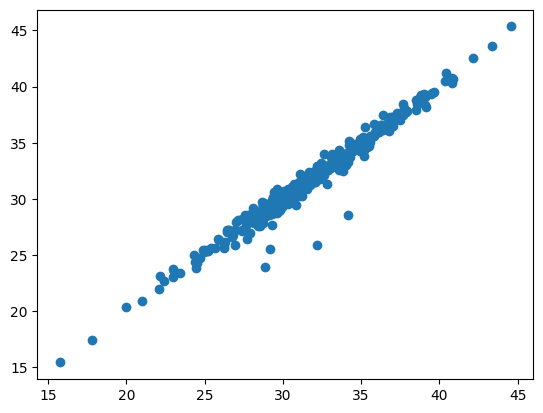

In [136]:
import matplotlib.pyplot as plt
plt.scatter(y_test, y_pred)
plt.show()

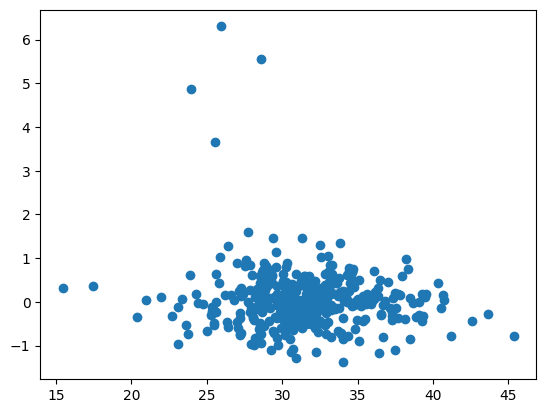

In [137]:
# 잔차 플랏
resid = y_test - y_pred

plt.scatter(y_pred, resid)
plt.show()

In [138]:
# # RFE 실행 (최종적으로 10개의 특성 선택)
# num_features = [3, 5, 7, 10, 20]
# for i in num_features:
#     rfe = RFE(estimator=optimal_elastic_net, n_features_to_select= i)
#     rfe.fit(X_train, y_train)

#     # RFE로 선택된 특성 이름 확인
#     selected_features_indices = rfe.support_
#     selected_features_names = X.columns[selected_features_indices]
#     print("최종 선택된 특성:", list(selected_features_names))

# # # 최종 선택된 특성으로 데이터프레임 생성
# # df_final_selected = ISIS_df[selected_features_names.tolist() + ['target']]
# # print("최종 데이터프레임:")
# # print(df_final_selected.head())